#### Create functions to find the best car for money and gas mileage
Choose a webstie such as Consumer Report, Edmund, Kelly Blue Book to choose top three recommended cars in a same catagory and make a recommendaiton for the best value car using your analysis. 

For example, according to the Consumer Reports the top three midsized cars are the following:
1. 2019 Subaru Legacy: purchase price: \$22,852, city mileage per galon: 26 mpg <br>
2. 2019 Toyota Camry: purchase price: \$22,639, city mileage per galon: 32 mpg <br>
3. 2019 Kia Optima: purchase price: \$18,900, city mileage per galon: 28 mpg <br>

<font color = green> <b>Create functions to calculate the best car for the money for the above three cars or choose any three cars of your choice in a same catagory.

In [1]:
# define structure of car

struct Car
  name::String
  price::Real
  mpg::Real
end


In [2]:
# Define some cars.

legacy = Car("Legacy", 22_852, 26)
camry = Car("Camry", 22_639, 32)
optima = Car("Optima", 18_900, 28)


allCars = [legacy, camry, optima];

In [3]:
# create a function to calculate a cost per mile

function costPerMile(car, costGasPerGal)
  carGalsPerMile = 1 / car.mpg
  return costGasPerGal * carGalsPerMile
end

# We could write this more briefly as:
# costPerMile(car, costGasPerGal) = (1/car.mpg) * carGalsPerMile

costPerMile (generic function with 1 method)

In [5]:
# create a function to provide car usage cost per mile

carUsageCost(car, miles, costGas) = miles * costPerMile(car, costGas)

carUsageCost (generic function with 1 method)

In [4]:
# create a function to provide a car total cost

carTotalCost(car, costGas, miles) = car.price + carUsageCost(car, miles, costGas)

carTotalCost (generic function with 1 method)

In [7]:
# used $2.10 for gas and 100,000 miles 

carTotalCost(legacy, 2.10, 100_000)

30928.923076923078

In [8]:
# used $2.10 for gas and 100,000 miles 

carTotalCost(camry, 2.10, 100_000)

29201.5

In [9]:
# used $2.10 for gas and 100,000 miles 

carTotalCost(optima, 2.10, 100_000)

26400.0

In [10]:
using Plots; gr()

Plots.GRBackend()

In [23]:
# How to plot a single car, using it's "cost function" (vs. miles).

function plotCarCost(car, milesRange, gasPrice)
  # Define a cost function (with miles input) for this particular car at this particular gas price.
  costFun(miles::Real) = carTotalCost(car, gasPrice, miles)
  plot(costFun, milesRange)
end

function plotCarCostsVsMiles(cars, milesRange, gasPrice)
  costFun(car) = miles -> carTotalCost(car, gasPrice, miles)
  costFuns = costFun.(cars)  # Or, costFuns = [costFun(car) for car in cars]
  labels = [car.name for car in cars]
  plot(costFuns, milesRange, title = "miles vs price", 
                            xlabel = "miles", ylabel = "cost", labels = labels)
end

plotCarCostsVsMiles (generic function with 1 method)

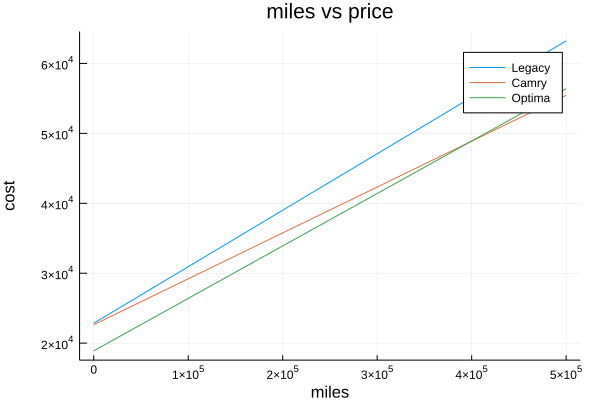

In [24]:
plotCarCostsVsMiles([legacy, camry, optima], 0:10_000:500_000, 2.10)

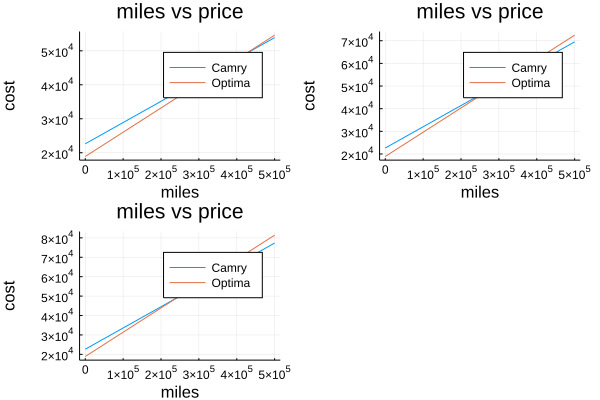

In [25]:
# gasPricesRange = 1.25:0.25:5

milesRange = 0:10_000:500_000

plot(
  plotCarCostsVsMiles([camry, optima], milesRange, 2.00),
  plotCarCostsVsMiles([camry, optima], milesRange, 3.00),
  plotCarCostsVsMiles([camry, optima], milesRange, 3.50)
)
    

### <font color = "green"> Conclustion: Camry is a good car to purchase if you plan to drive for at least 300,000 miles but the best car for the money driving 200,000 miles or less is Optima.